In [1]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.backends.backend_pdf import PdfPages

import glob
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

import os

from funcs_query import query

from specdb.specdb import SpecDB, IgmSpec
from astropy.io import fits

In [2]:
igmsp = SpecDB('/media/bartosz/USB STICK/BOSS_DR14/IGMspec_DB_v03.1.hdf5')
meta_dr14 = igmsp['BOSS_DR14'].meta

Database is igmspec
Created on 2019-Mar-06
Version: v03.1


In [3]:
fpath = '/media/bartosz/USB STICK/dr16q_prop_May16_2023.fits'

# Open the .fits file
with fits.open(fpath) as hdul:
    # Access the data from the primary HDU (header/data unit)
    data_dr16 = hdul[1].data

In [4]:
w1l = 13450     # water absorption observed WL
w1r = 14250
w2l = 18200
w2r = 19400

elines = [1033.82,1215.24,1240.81,1263,1305.53,1335.31,1399.8,1486,1549.48,1640.4,1665.85,1750,1857.4,1900,2069.59,2326,2439.5,2799.117]
enames = ['O VI', r'Ly-$\alpha$', 'N V','Si II', 'O I', 'C II', 'Si IV + O IV]', 'N IV]', 'C IV', 'He II', 'O III]', 'N III]', 'Al III', 'C III] + Si III]',
          'Fe III','C II]', '[Ne IV]', 'Mg II']

In [5]:
def power_law(x,alpha,beta):
    return alpha*x**beta

hdpath = '/media/bartosz/USB STICK/highz_data/'
hfpath = hdpath + 'fits/'#sigma_clipped/'
hnpath = hdpath + 'normed/'#sigma_clipped/'

lpath = '/media/bartosz/USB STICK/BOSS_DR14_ext/'

# power law parameters
hpl = np.loadtxt(hdpath + 'power_law_fits_spline_rsq_cl_bound.txt', dtype='str')
plname = hpl[:,0]
hCs = [float(a) for a in hpl[:,1]]
halphas = [float(b) for b in hpl[:,3]]

lpl = np.loadtxt(lpath + 'power_law_fits_spline_rsq_cl_bound.txt', dtype='str')
plidx = [int(i) for i in lpl[:,0]]
lCs = [float(a) for a in lpl[:,2]]
lalphas = [float(b) for b in lpl[:,4]]


def plot_xdata(idx,z,fig,ax,lw,bs,pl):
    filename = glob.glob(hnpath + '{}_norm.txt'.format(idx))[0]
    normed = np.loadtxt(filename)

    norm_wl = normed[:,0]
    norm_flux = normed[:,1]
    norm_sig = normed[:,2]

    C = hCs[np.where(plname == idx)[0][0]]
    alpha = halphas[np.where(plname == idx)[0][0]]

    if bs == 1:
        if pl:
            xdata = norm_wl
            ydata = norm_flux - power_law(xdata,C,alpha)
        else:
            xdata = norm_wl
            ydata = norm_flux
    else:
        bin_size = bs
        wl_rebin,flux_rebin,sig_rebin=[],[],[]
        j = 0
        while j <= len(norm_wl)-bin_size:
            wl_rebin.append(np.mean(norm_wl[j:j+bin_size]))
            flux_rebin.append(np.mean(norm_flux[j:j+bin_size]))
            sig_rebin.append(np.sqrt(np.sum([k**2 for k in norm_sig[j:j+bin_size]]))/3)
            j+=bin_size

        xdata = np.array(wl_rebin)
        if pl:
            ydata = np.array(flux_rebin) - power_law(xdata,C,alpha)
        else:
            ydata = np.array(flux_rebin)
    
    ax.plot(xdata,ydata,linewidth=lw, drawstyle='steps-mid', color='red',alpha=0.5,zorder=1)
    ax.axvspan(w1l/(1+z),w1r/(1+z),facecolor='white',zorder=2)
    ax.axvspan(w2l/(1+z),w2r/(1+z),facecolor='white',zorder=2)
    mask1 = xdata > 1250
    mask2 = xdata < 2250
    mask = np.logical_and(mask1,mask2)
    return min(ydata[mask]),max(ydata[mask])


def plot_xfit(idx,z,fig,ax,lw,pl):

    filename = glob.glob(hfpath + '{}_*.txt'.format(idx))[0]
    fit = np.loadtxt(filename)

    fit_wl = fit[:,0]
    fit_flux = fit[:,1]

    # hide fit in excluded regions
    wmask1 = np.logical_or(fit_wl<w1l/(1+z),fit_wl>w1r/(1+z))
    wmask2 = np.logical_or(fit_wl<w2l/(1+z),fit_wl>w2r/(1+z))
    wmask = np.logical_and(wmask1,wmask2)

    C = hCs[np.where(plname == idx)[0][0]]
    alpha = halphas[np.where(plname == idx)[0][0]]

    lymask = fit_wl > 1216
    zeromask = fit_flux != 0
    comask = np.logical_and(lymask,zeromask)

    fimask = np.logical_and(wmask,comask)
    
    xdata = fit_wl[fimask]
    if pl:
        ydata = fit_flux[fimask] - power_law(xdata,C,alpha)
    elif not pl:
        ydata = fit_flux[fimask]

    ax.plot(xdata,ydata,linewidth=lw, drawstyle='steps-mid', color='red', zorder=1)
    ax.axvspan(w1l/(1+z),w1r/(1+z),facecolor='white',zorder=2)
    ax.axvspan(w2l/(1+z),w2r/(1+z),facecolor='white',zorder=2)
        
    mask1 = xdata > 1250
    mask2 = xdata < 2250
    mask = np.logical_and(mask1,mask2)
    return min(ydata[mask]),max(ydata[mask])


def find_dir(idx):
    sf2 = glob.glob(lpath + 'spectra_2_3/' + '{}_*.txt'.format(idx))
    sf3 = glob.glob(lpath + 'spectra_3_4/' + '{}_*.txt'.format(idx))
    sf1 = glob.glob(lpath + 'spectra_07_2/' + '{}_*.txt'.format(idx))
    if len(sf2) > 0: 
        specf = 'spectra_2_3/'
    elif len(sf3) > 0:
        specf = 'spectra_3_4/'
    elif len(sf1) > 0:
        specf = 'spectra_07_2/'
    else: print('eBOSS spec path could not be found')
    return specf


def plot_nfit(idx,fig,ax,lw,pl):

    filename = glob.glob(lpath + find_dir(idx) + 'fits/{}_*_0_dpx25.txt'.format(idx))[0]
    fit = np.loadtxt(filename)

    fit_wl = fit[:,0]
    fit_flux = fit[:,1]

    C = lCs[plidx.index(idx)]
    alpha = lalphas[plidx.index(idx)]

    lymask = fit_wl > 1216
    zeromask = fit_flux != 0
    comask = np.logical_and(lymask,zeromask)
    
    xdata = fit_wl[comask]
    if pl:
        ydata = fit_flux[comask] - power_law(xdata,C,alpha)
    elif not pl:
        ydata = fit_flux[comask]
    
    ax.plot(xdata,ydata ,linewidth=lw, drawstyle='steps-mid', color='blue', alpha=0.6)
    
    mask1 = xdata > 1250
    mask2 = xdata < 2250
    mask = np.logical_and(mask1,mask2)
    return min(ydata[mask]),max(ydata[mask])


def plot_ndata(idx,fig,ax,lw,pl):
    filename = glob.glob(lpath + find_dir(idx) + 'normed/{}_*_norm.txt'.format(idx))[0]
    norm = np.loadtxt(filename)
    
    norm_wl = norm[:,0]
    norm_flux = norm[:,1]

    C = lCs[plidx.index(idx)]
    alpha = lalphas[plidx.index(idx)]

    xdata = norm_wl
    if pl:
        ydata = norm_flux - power_law(xdata,C,alpha)
    elif not pl:
        ydata = norm_flux
    
    ax.plot(xdata,ydata,linewidth=lw, drawstyle='steps-mid', color='blue', alpha=0.5)
    mask1 = xdata > 1250
    mask2 = xdata < 2250
    mask = np.logical_and(mask1,mask2)
    return min(ydata[mask]),max(ydata[mask])

    
def func(z):
    def func2(x):
        return x*(1+z)
    return func2

def inv(z):
    def inv2(x):
        return x/(1+z)
    return inv2

In [21]:
custom_lines = [Line2D([0], [0], color='r', lw=1),
                Line2D([0], [0], color='b', lw=1),
                Patch(facecolor='grey', alpha=0.4)]

hmeta = np.loadtxt(hdpath + 'meta_data_v2.txt',dtype='str')
qlist = hmeta[:,0]
hZ = hmeta[:,1]

NN_uncorr = np.loadtxt(hdpath + 'highZ_NN_uncorr_lbol10%.txt', dtype='str')
NN_corr = np.loadtxt(hdpath + 'highZ_NN_corr_lbol10%.txt', dtype='str')

cmap = plt.get_cmap('tab10')
colors = cmap(range(7))
markers = ['o', 's', '^', 'x', '*']

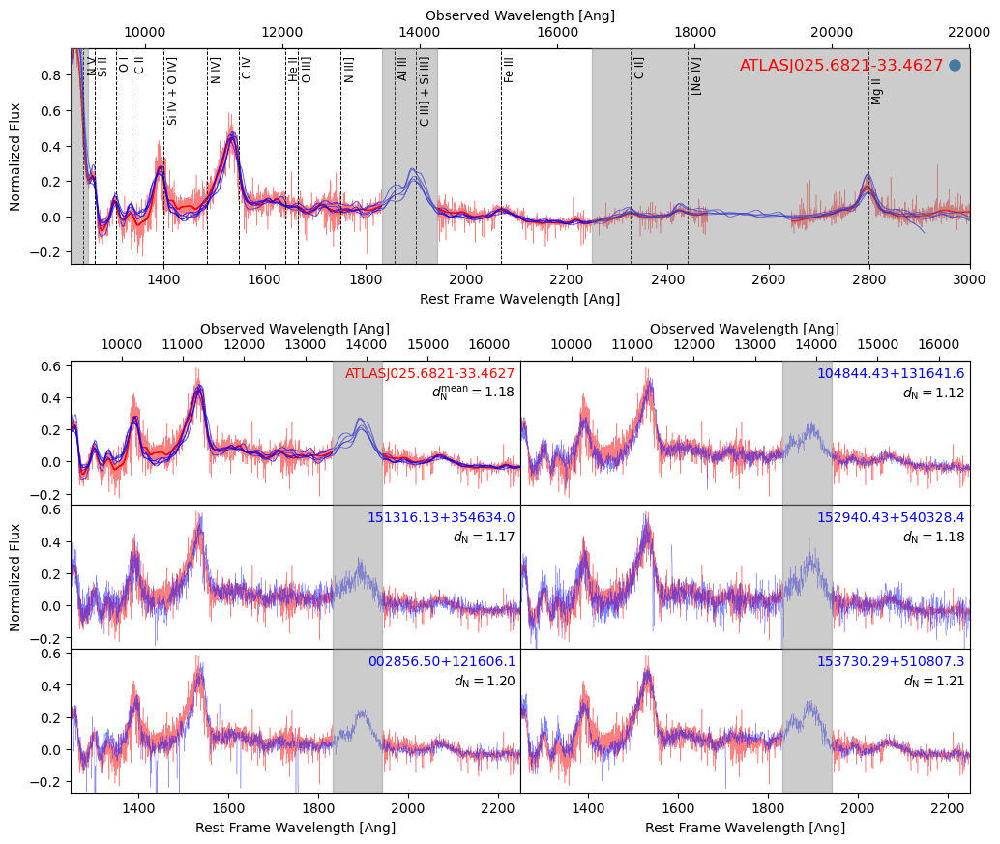

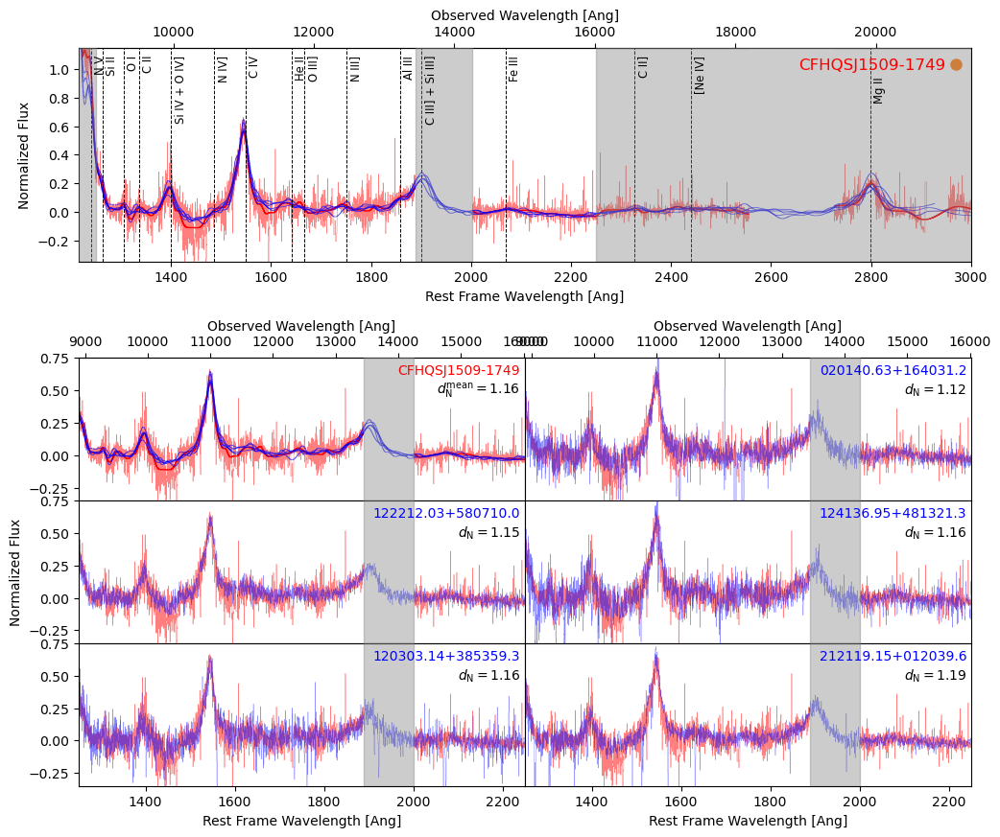

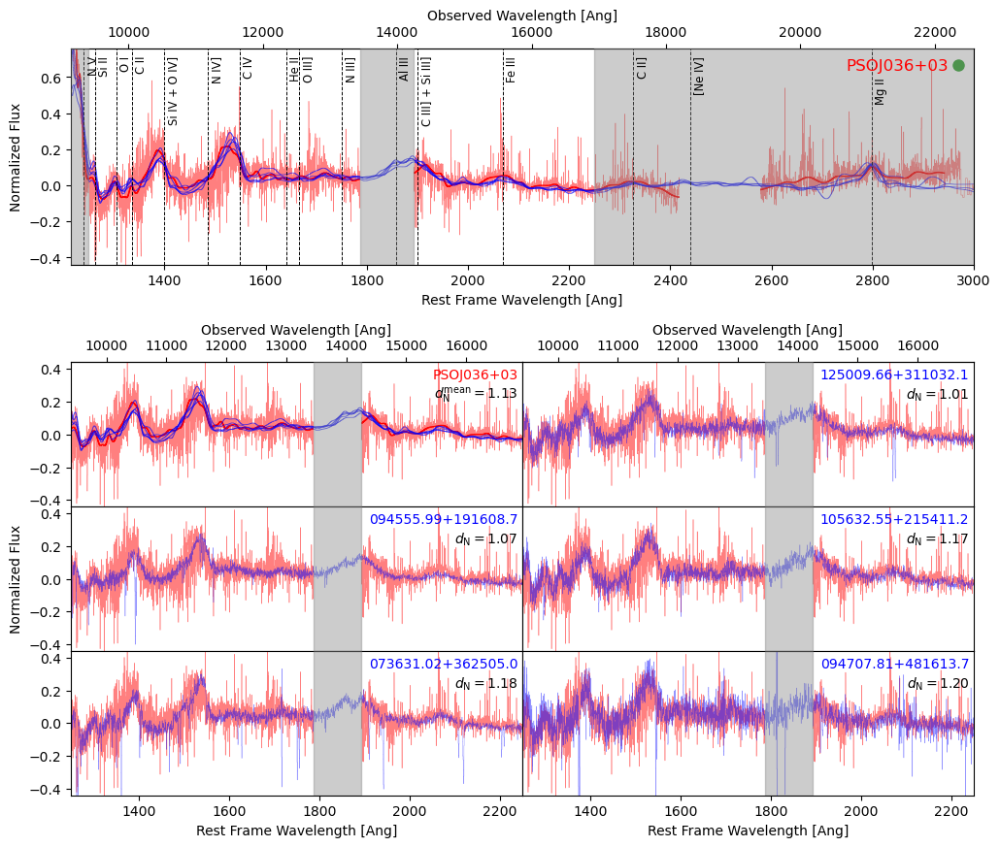

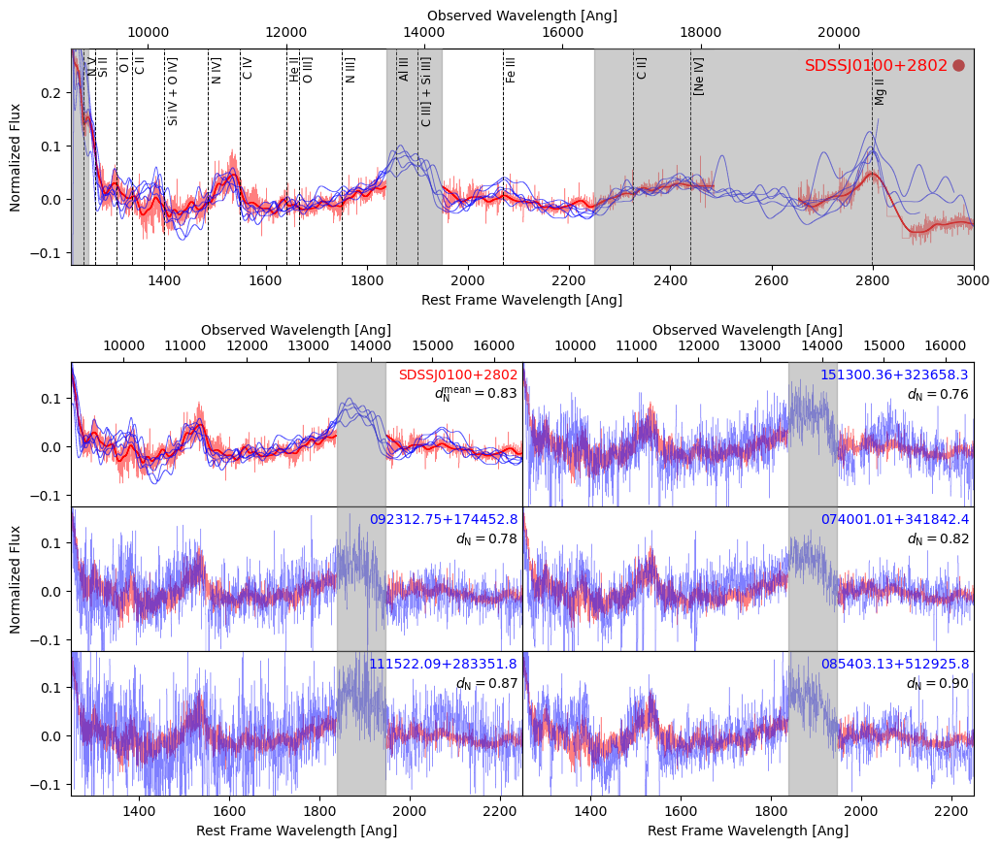

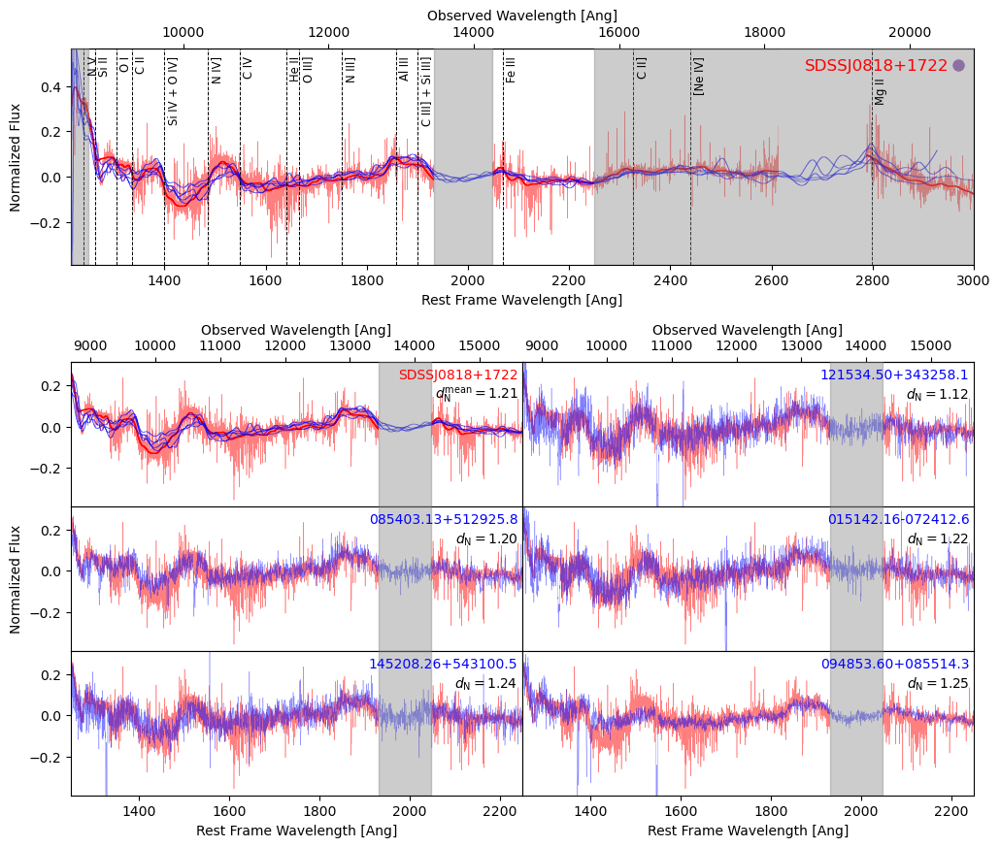

...

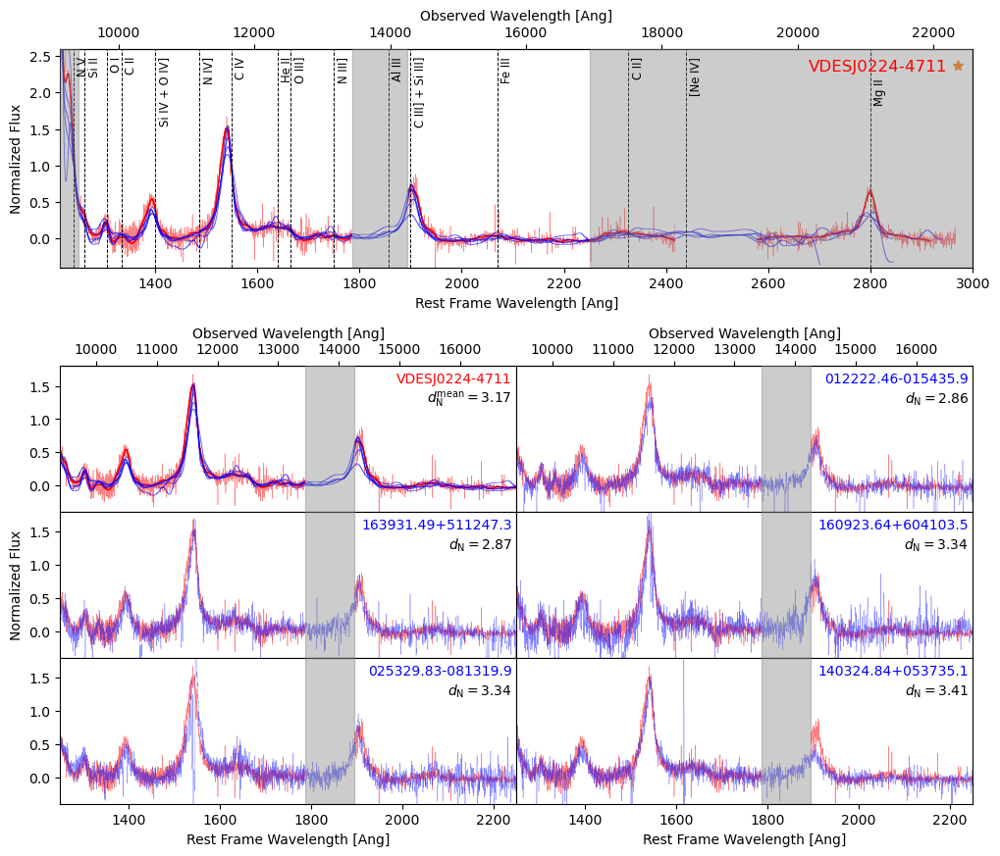

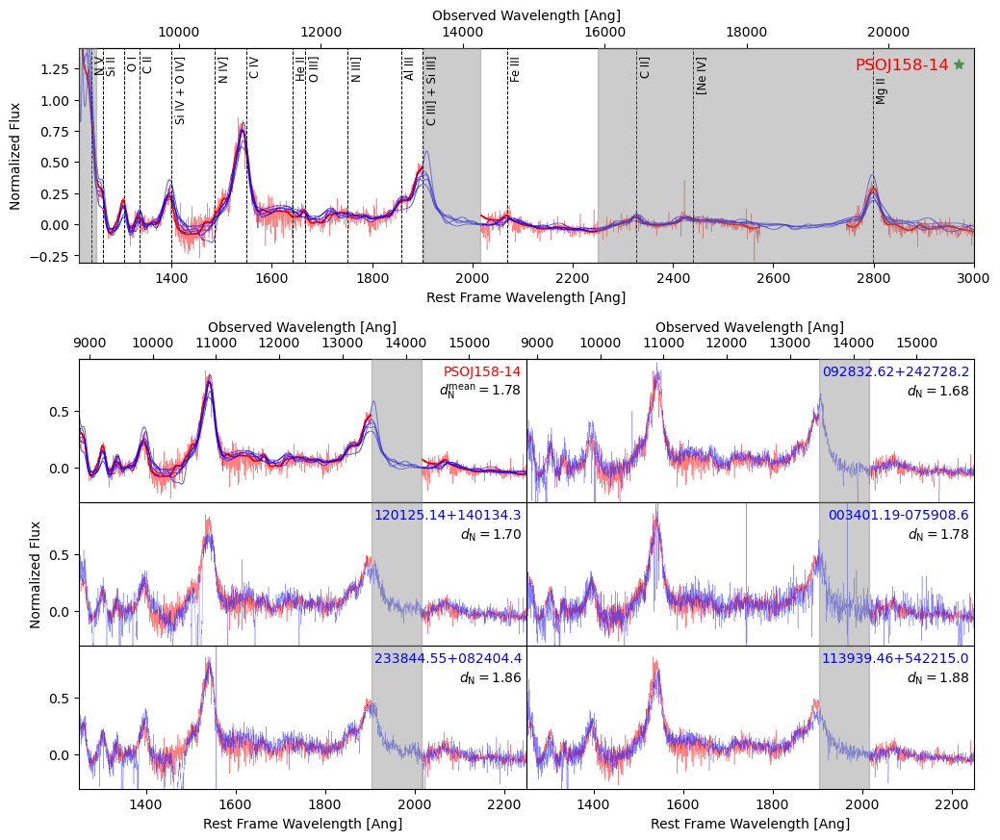

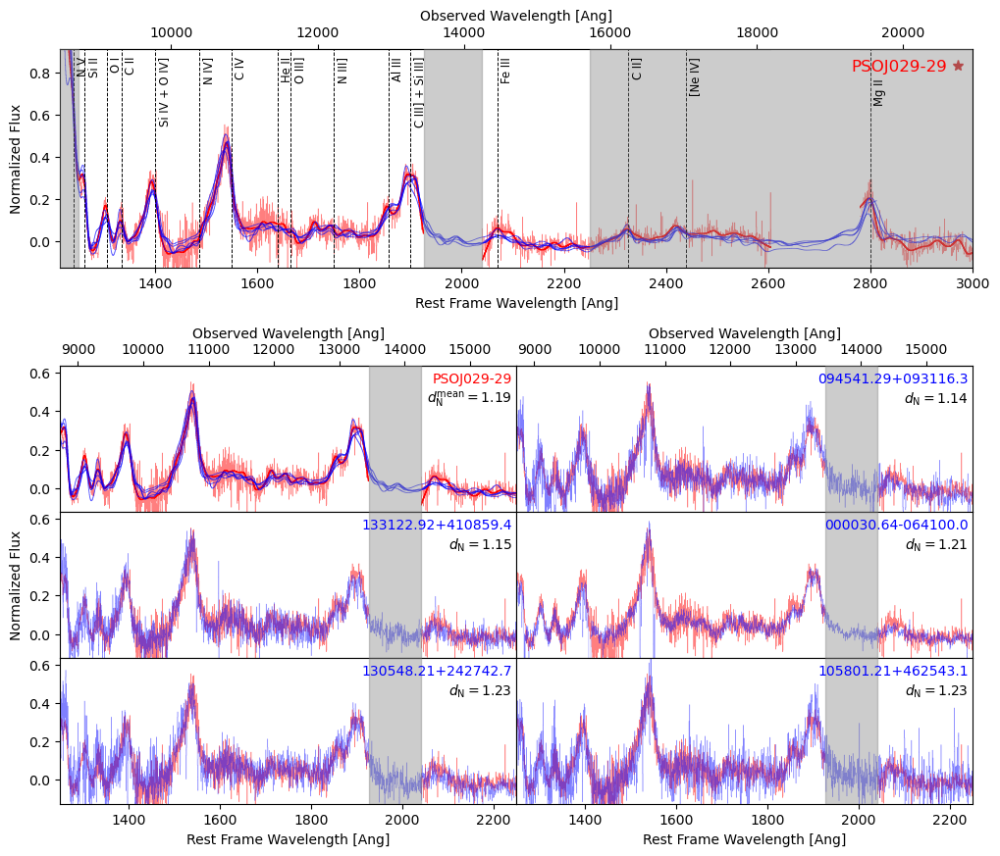

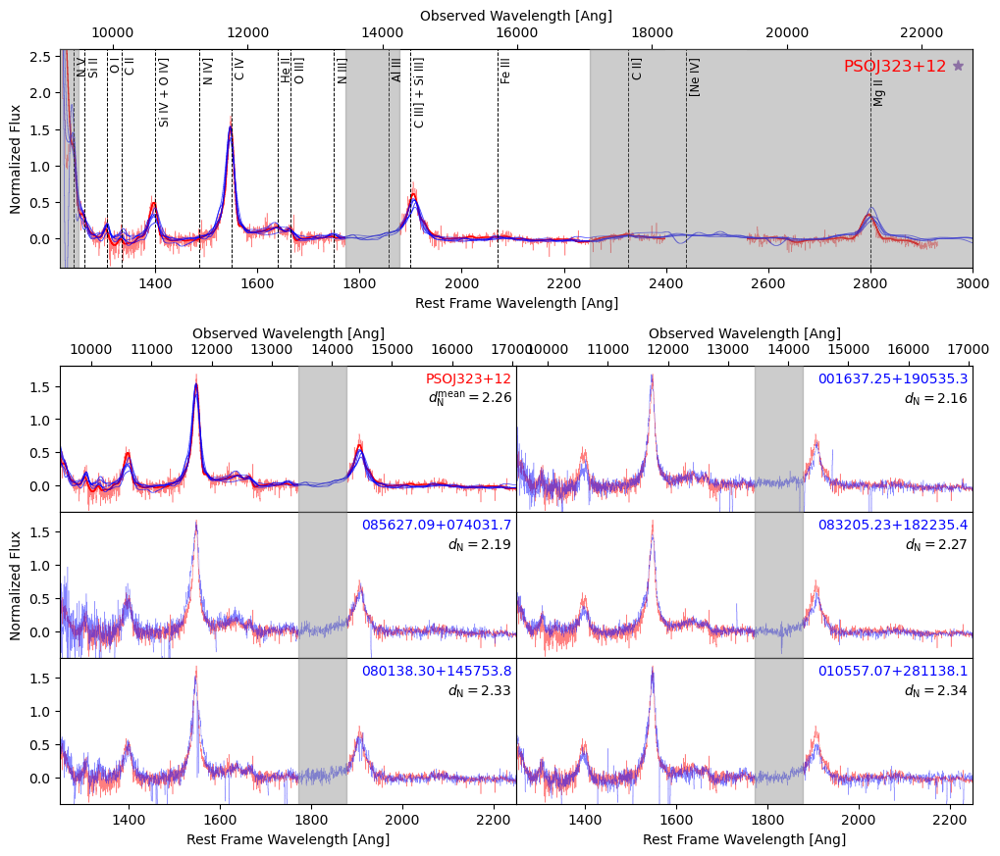

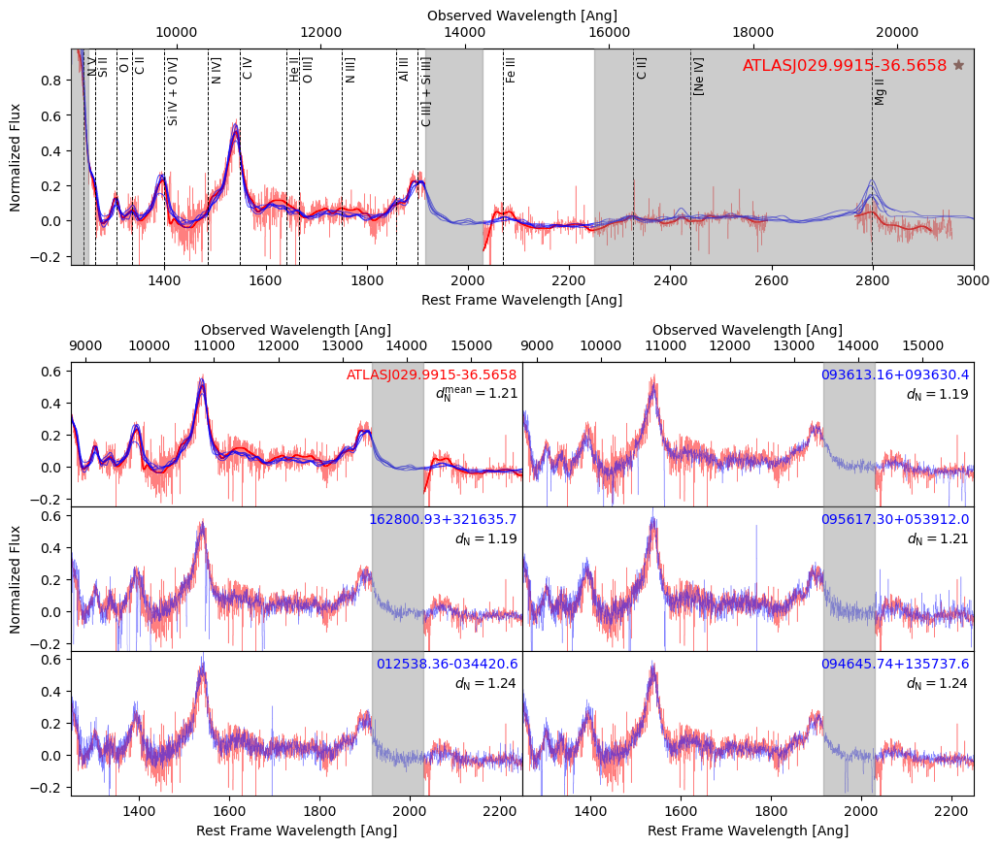

In [35]:
pl = True

if pl:
    NN = NN_corr
    plot_folder = 'corr'
else:
    NN = NN_uncorr
    plot_folder = 'uncorr'
    
qlist_NN = NN[:,0]
IDX_NN = NN[:,1:6]
D_NN = NN[:,6:11]

# manual plot settings
index = [1,2,3,12,15,22,23,24,25,26,27,28,29,30,31,32,33]  # idx of qso
binsizes = [3,3,2,5,4,1,1,1,1,1,1,1,1,1,1,1,1]                   # bin size
ylimits = [(-0.3,0.7),(-0.4,0.4),(-0.11,0.16),(-1.2,1.5),(-1.4,1.4),(-0.3,1.1),(-0.3,0.9),           # y axis limits
           (-0.3,0.8),(-0.25,2.3),(-0.2,0.3),(-0.2,0.65),(-0.3,0.35),(-0.3,1.7),(-0.25,0.9),(-0.09,0.6),(-0.3,1.7),(-0.21,0.61)]

clr,mkr=0,0
# pp = PdfPages('plots/nplots/highz_nn_Lmatched_corr.pdf')
for i,qname in enumerate(qlist_NN):
    hmeta_idx = np.where(qname==qlist)[0][0]
    z = float(hZ[hmeta_idx])

    idx_nn, d_nn = np.array([int(id) for id in IDX_NN[i]]), np.array([float(d) for d in D_NN[i]])
    dmean = np.mean(d_nn)

    mkrtype = markers[mkr]
    mkrclr = colors[clr]
    clr+=1
    if (i+1)%7==0:
        mkr+=1
        clr=0
    
    fig = plt.figure(figsize=(12, 10))
    gs = fig.add_gridspec(2, 1, hspace=0.3, height_ratios=[6,12])
    
    gs0 = gs[0].subgridspec(1, 1)#, wspace=0, hspace=0)
    gs1 = gs[1].subgridspec(3, 2, wspace=0,hspace=0)

    # Create subplots within the gridspec
    ax0 = gs0.subplots()
    a,b,c = gs1.subplots(sharey='row',sharex='col')
    ax1,ax2,ax3,ax4,ax5,ax6 = a[0],a[1],b[0],b[1],c[0],c[1]
    axes = [ax1,ax2,ax3,ax4,ax5,ax6]

    # # Plot data on each subplot
    # try:
    #     ylimit = plot_xdata(qname,z,fig,ax0,0.4,3,pl)
    # except Exception as error:            
    #     err = type(error).__name__
    #     print('{} not plotted:'.format(qname), err) 
    #     plt.close()
    #     continue

    if i in index:
        bs = binsizes[index.index(i)]
        ylimit = ylimits[index.index(i)]
        plot_xdata(qname,z,fig,ax0,0.4,bs,pl)
    else:
        bs = 3
        ylimit = plot_xdata(qname,z,fig,ax0,0.4,bs,pl)

    plot_xdata(qname,z,fig,ax1,0.4,bs,pl)
    plot_xfit(qname,z,fig,ax0,1,pl)
    plot_xfit(qname,z,fig,ax1,1,pl)
    yrange = ylimit[1] - ylimit[0]
    ymax = ylimit[1]+0.05*yrange
    ymin = ylimit[0]-0.05*yrange
    for j,nn in enumerate(idx_nn):
        plot_nfit(nn,fig,ax0,0.6,pl)
        plot_nfit(nn,fig,ax1,0.6,pl)

        plot_xdata(qname,z,fig,axes[j+1],0.4,bs,pl)
        # plot_xfit(qname,z,fig,axes[j+1],1,pl)
        plot_ndata(nn,fig,axes[j+1],0.3,pl)
        # plot_nfit(nn,fig,axes[j+1],0.6,pl)

        axes[j+1].axvspan(w1l/(1+z), w1r/(1+z), alpha=0.4, color='grey',zorder=3)
        # axes[j+1].set_ylim(1.2*ymin,1.15*ymax)
        axes[j+1].set_xlim(1250,2250)
        # axes[j+1].legend(custom_lines, [r'$d_\text{{N}}={:.3f}$'.format(d_nn[j]), 'idx {}'.format(idx_nn[j])], loc='upper right')
        sdssname = data_dr16[query(meta_dr14,data_dr16,idx_nn[j])]['SDSS_NAME']
        axes[j+1].text(2240,ymax-0.13*yrange,'{}'.format(sdssname),c='blue',ha='right',size='medium')
        axes[j+1].text(2240,ymax-0.28*yrange,r'$d_\text{{N}}={:.2f}$'.format(d_nn[j]),c='black',ha='right',size='medium')

    ax0.axvspan(1000,1250,alpha=0.4,color='grey',zorder=3)
    ax0.axvspan(2250,3000,alpha=0.4,color='grey',zorder=3)
    ax0.axvspan(w1l/(1+z), w1r/(1+z), alpha=0.4, color='grey',zorder=3)    
    for j, l in enumerate(elines[2:-1]):
        ax0.axvline(l,c='black',ls='--',lw=0.7)
        ax0.text(l+6,ymax+yrange*0.35,enames[j+2],c='black',rotation='vertical',va='top',size='small')
    ax0.axvline(elines[-1],c='black',ls='--',lw=0.7)
    ax0.plot(2970,ymax+yrange*0.285,color=mkrclr,marker=mkrtype,markersize=8)
    ax0.text(elines[-1]+6,ymax+yrange*0.2,enames[-1],c='black',rotation='vertical',va='top',size='small')   
    ax0.text(2950,ymax+0.25*yrange,'{}'.format(qname),c='red',ha='right',size='large')
    ax0.set_xlim(1215,3000)
    ax0.set_ylim(ymin,ymax+yrange*0.4)
    ax0.set_ylabel('Normalized Flux')
    ax0.set_xlabel('Rest Frame Wavelength [Ang]')
    sax0 = ax0.secondary_xaxis('top', functions=(func(z),inv(z)))
    sax0.set_xlabel('Observed Wavelength [Ang]')    

    ax1.set_ylim(ymin,ymax)
    ax3.set_ylim(ymin,ymax)
    ax5.set_ylim(ymin,ymax)

    ax1.axvspan(w1l/(1+z), w1r/(1+z), alpha=0.4, color='grey',zorder=3)
    ax1.text(2240,ymax-0.13*yrange,'{}'.format(qname),c='red',ha='right',size='medium')
    ax1.text(2240,ymax-0.28*yrange,r'$d_\text{{N}}^\text{{mean}}={:.2f}$'.format(dmean),c='black',ha='right',size='medium')
    # ax1.legend([Line2D([0], [0], color='r', lw=1)], [r'$d_\text{{N,mean}}={:.3f}$'.format(dmean)], loc='upper right')
    
    sax1 = ax1.secondary_xaxis('top', functions=(func(z),inv(z)))
    sax1.set_xlabel('Observed Wavelength [Ang]')    
    sax2 = ax2.secondary_xaxis('top', functions=(func(z),inv(z)))
    sax2.set_xlabel('Observed Wavelength [Ang]')

    # ax1.set_ylabel('norm. flux')
    ax3.set_ylabel('Normalized Flux')
    # ax5.set_ylabel('norm. flux')
    ax5.set_xlabel('Rest Frame Wavelength [Ang]')
    ax6.set_xlabel('Rest Frame Wavelength [Ang]')
    
    ax2.tick_params(axis='y', which='both', left=False, labelleft=False)
    ax4.tick_params(axis='y', which='both', left=False, labelleft=False)
    ax6.tick_params(axis='y', which='both', left=False, labelleft=False)

    plt.savefig('plots/nplots/{}/{}.pdf'.format(plot_folder,qname),bbox_inches='tight')
    # pp.savefig(fig)

    plt.show()
    plt.close()
    # break
# pp.close()

In [19]:
# query(meta_dr14,data_dr16,399361)
print(data_dr16[query(meta_dr14,data_dr16,372445)]['SDSS_NAME'])
print(data_dr16[query(meta_dr14,data_dr16,439311)]['SDSS_NAME'])
print(data_dr16[query(meta_dr14,data_dr16,338193)]['SDSS_NAME'])
print(data_dr16[query(meta_dr14,data_dr16,250188)]['SDSS_NAME'])
print(data_dr16[query(meta_dr14,data_dr16,366969)]['SDSS_NAME'])

154317.86+183703.3
234607.67+152653.4
142507.59+584115.8
115544.71+131650.9
152755.21+292101.3
